# K-nearest neighbors

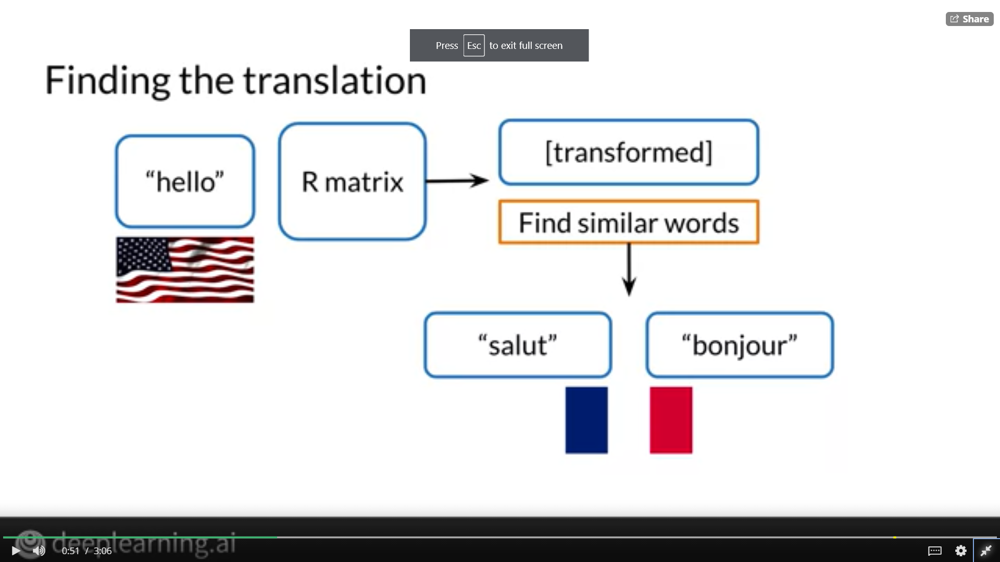

 Notice that it transformed word vector after the transformation of its embedding through an R matrix would be in the French word vector space. But it is not going to be necessarily identical to any of the word vectors in the French word vector space.<br> You need to search through the actual French word vectors to find a French word that is similar to the one that you created from the transformation.

#### So the question is, how do you find similar word vectors?

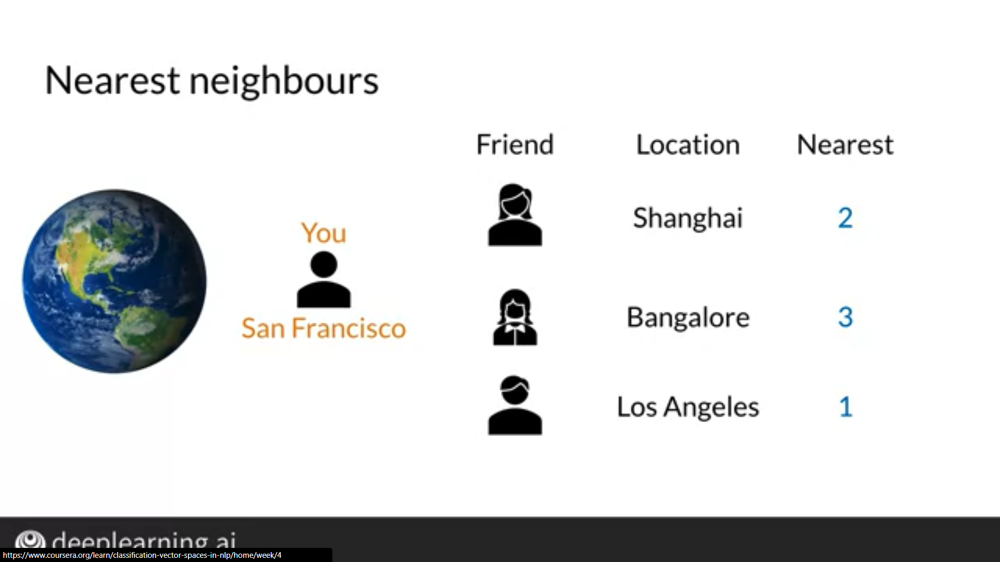

You can sort your friends by their distances to San Francisco, then rank them by how close they are. Notice that if you have a lot of friends, which I'm sure you do, `this is a very time intensive process.`

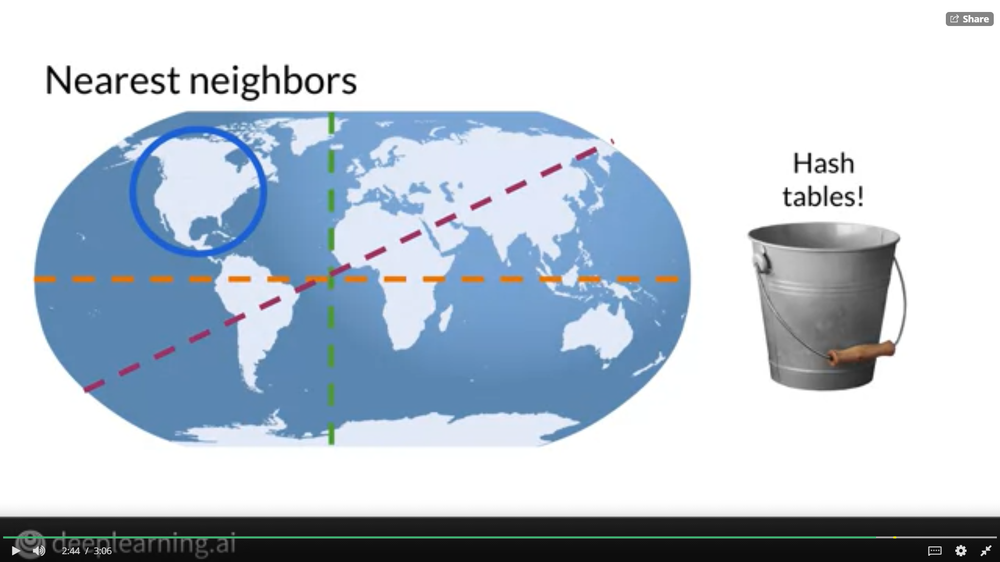

* Is there a more efficient way to do this? Notice that two of these friends live in another continent, while the third friend lives in the United States. Could you have just searched for a subset of friends who live in the United States? 
* You might have realized that it may not have been necessary to go through all of your friends in your address in order to find the ones closest to you. You might have imagined if you somehow could filter on which friends were all in a general region, such as North America, then you could just search within that sub group of friends. 
* If there is a way to slice up the geographic space into regions, you could search just within those regions. When you think about organizing subsets of a dataset efficiently, you may think about placing your data into buckets. 
* If you think about buckets, then you'll definitely want to think about hash tables. Hash tables are useful tools for any kind of work involving data

# Hash tables and hash functions

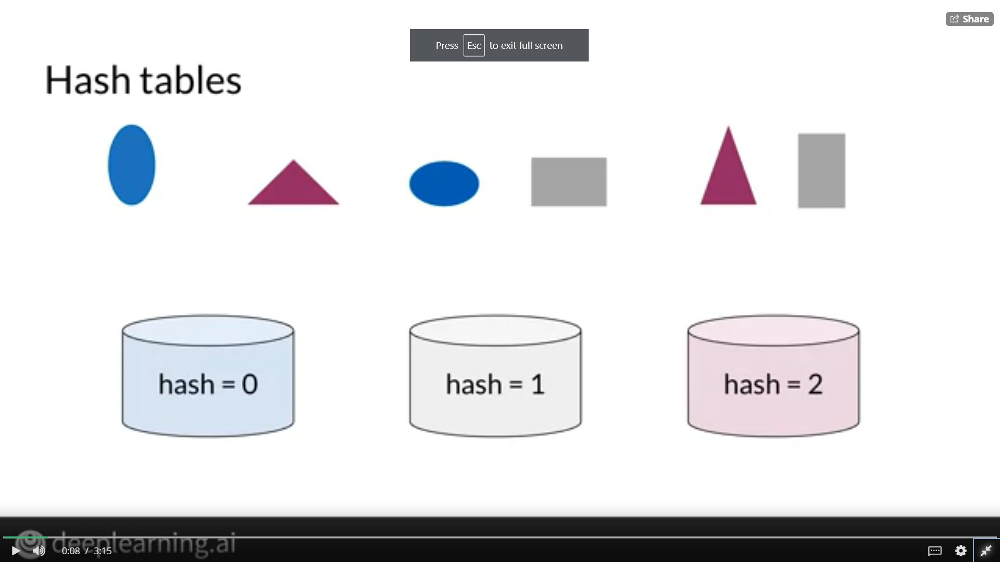

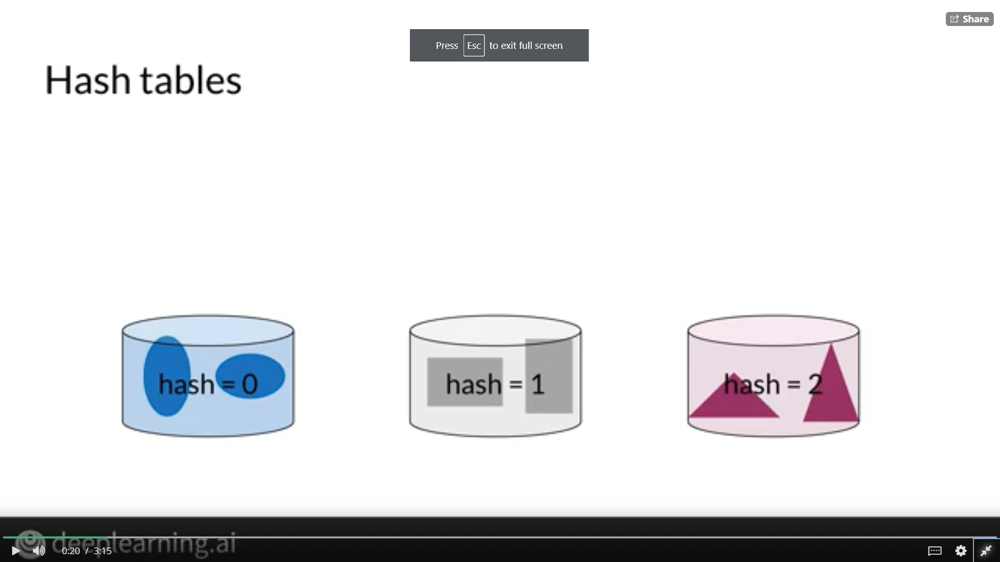

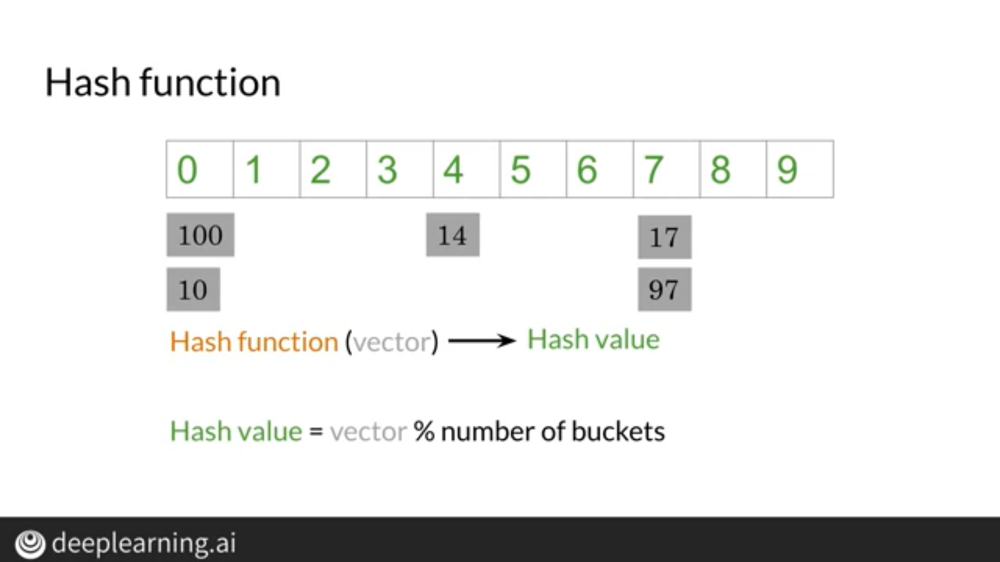

Now let's think about how we'd like to do this with word vectors. <br>First, let's assume that the word vectors have just 1 dimension instead the 300 dimensions. So each word is represented by a single number such as 100, 14 ,17, 10 and 97. You need to find a way to give each vector a hash value which is a key that tells it which bucket it's assigned to. A function that assigns a hash value is called a hash function. In this example, here is a hash table which is a set of buckets. In this case, the hash table has ten buckets.

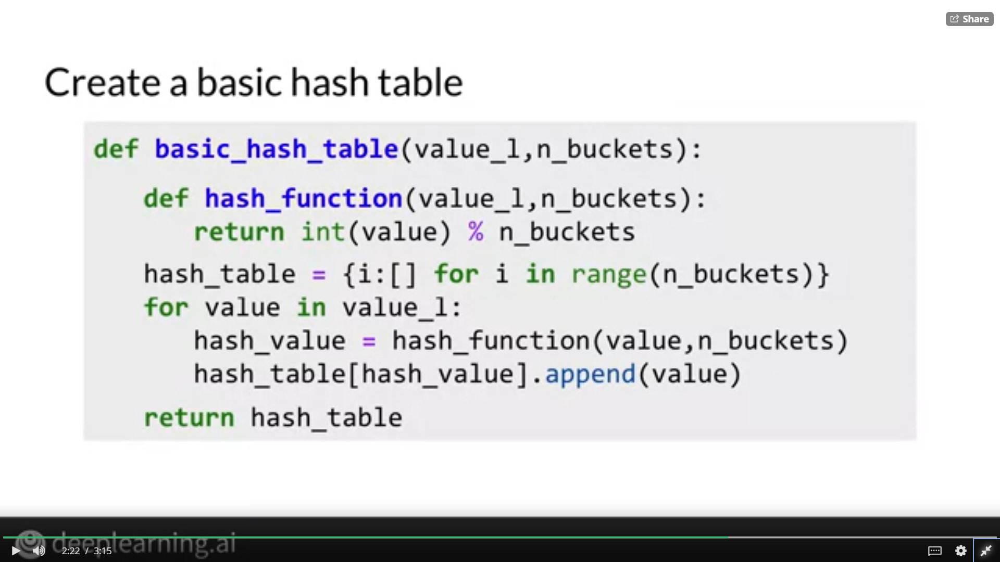

Now given an input, you don't have to compare it to all the other examples, you can just compare it to all the values in the same hash_bucket that input has been hashed to. 

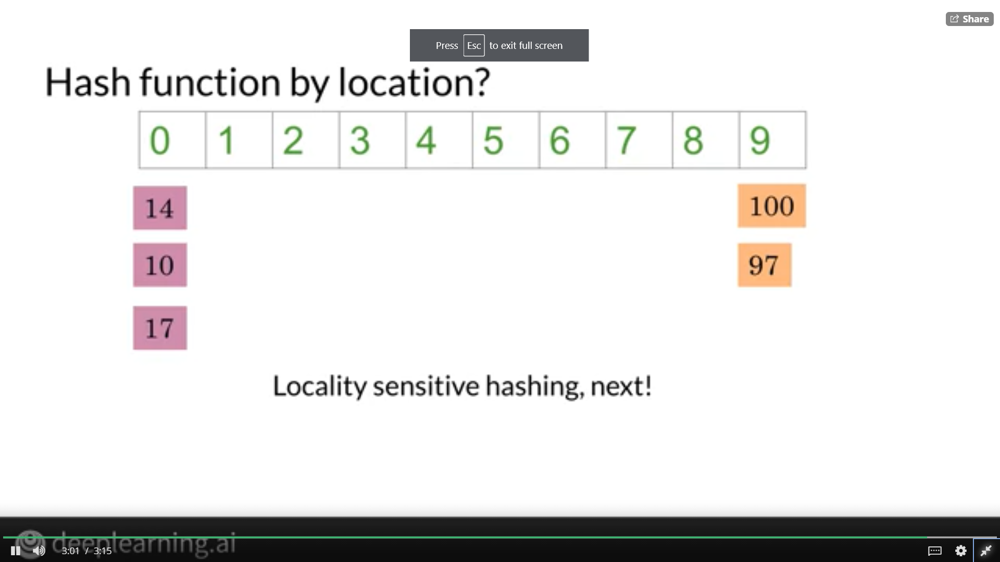

Ideally, you want to have a hash function that puts similar word vectors in the same bucket like this.
<br>
To do this you'll need to use what's called locality sensitive hashing. Locality is another word for location, sensitive is another word for caring. `So locality sensitive hashing is a hashing method that's cares very deeply about assigning items based on where they're located in vector space.`

# Locality sensitive hashing


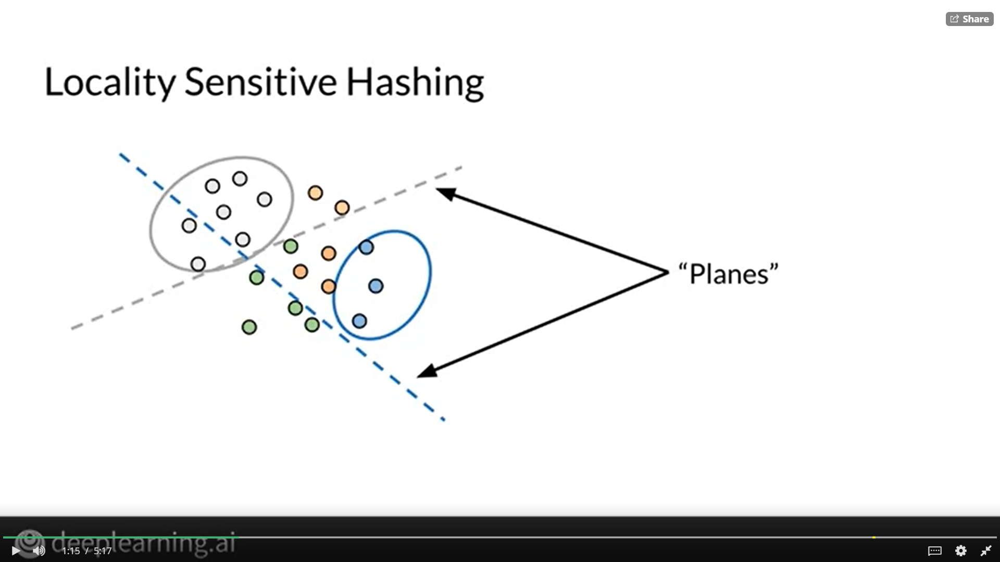

* To start thinking about locality-sensitive hashing, let's first assume that you're using word vectors with just two dimensions. 
* I'll depict each vector as a circle instead of arrows. So let's say you want to find a way to know that these blue dots are somehow close to each other, and that these gray dots are also related to each other.
* First, divide the space using these dashed lines, which I'll call planes. I'll explain why I called them planes in a bit. Notice how the blue plane slices up the space into vectors that are above it or below it. The blue vectors all happen to be on the same side of the blue plane. Similarly, the gray vectors happen to be above the gray plane. It looks like the planes can help us bucket the vectors into subsets based on their location. This is exactly what you want.
* A hashing function that is sensitive to the location of the items that it's assigning into buckets. You're working your way towards locality-sensitive hashing. Now, let's see why I'm calling these dashed lines planes.

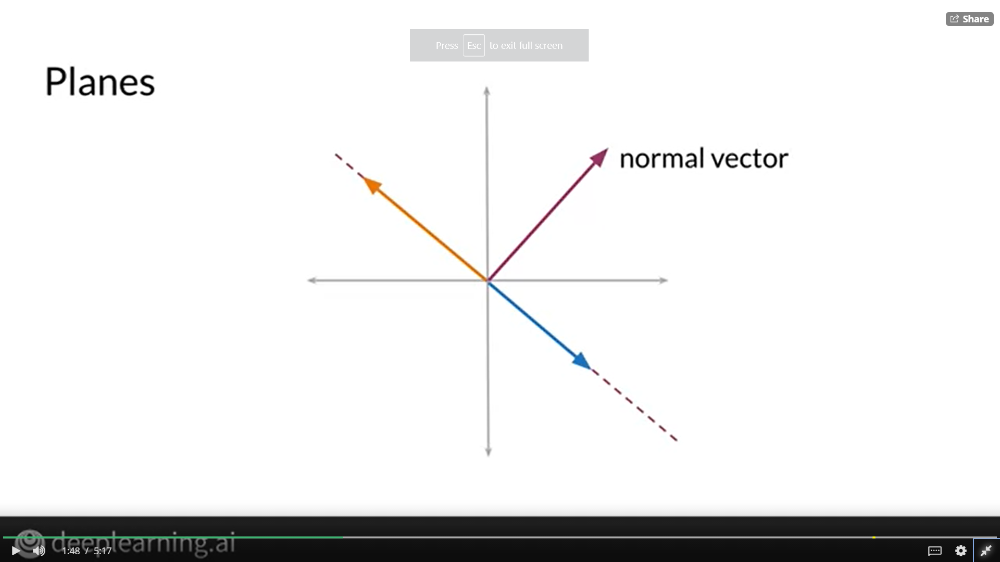

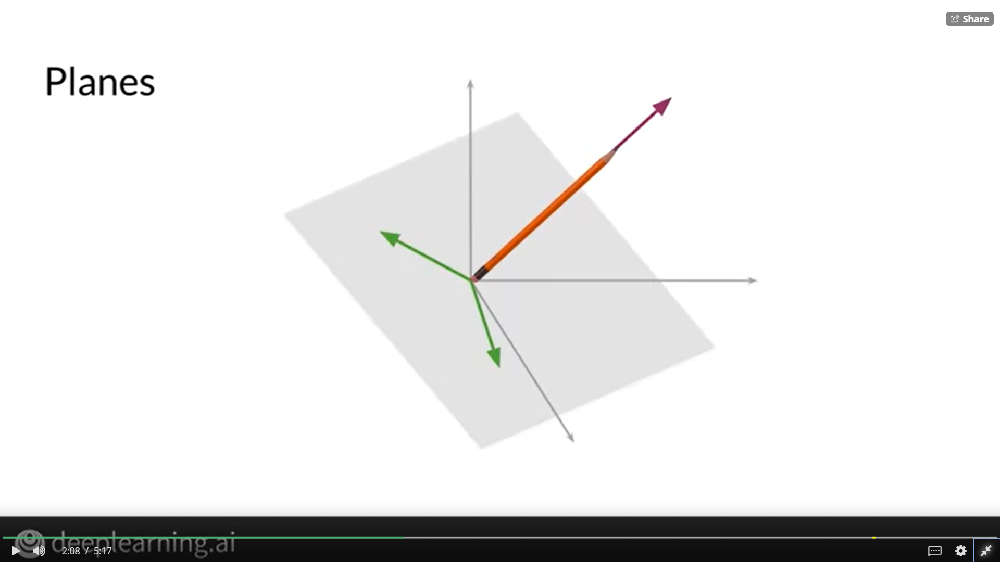

Dot product of all 3 vectors with P(perpendicular to plane)

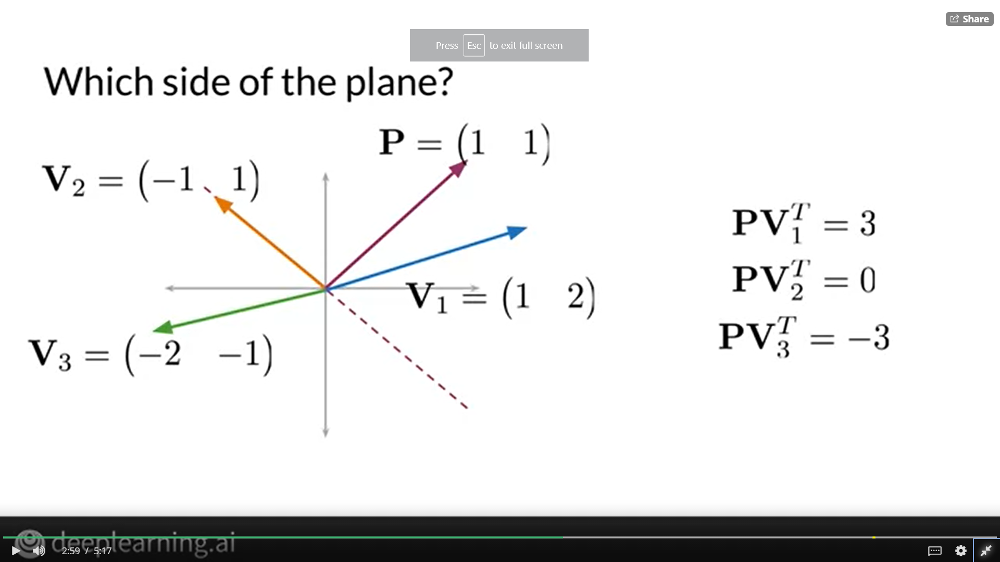

Do you notice something about the signs and how they're related to their position relative to the red plane?
`When the dot product is positive, the vector is on one side of the plane. If the dot product is negative, the vector is on the opposite side of the plane. If the dot product is zero, the vector is on the plane. `

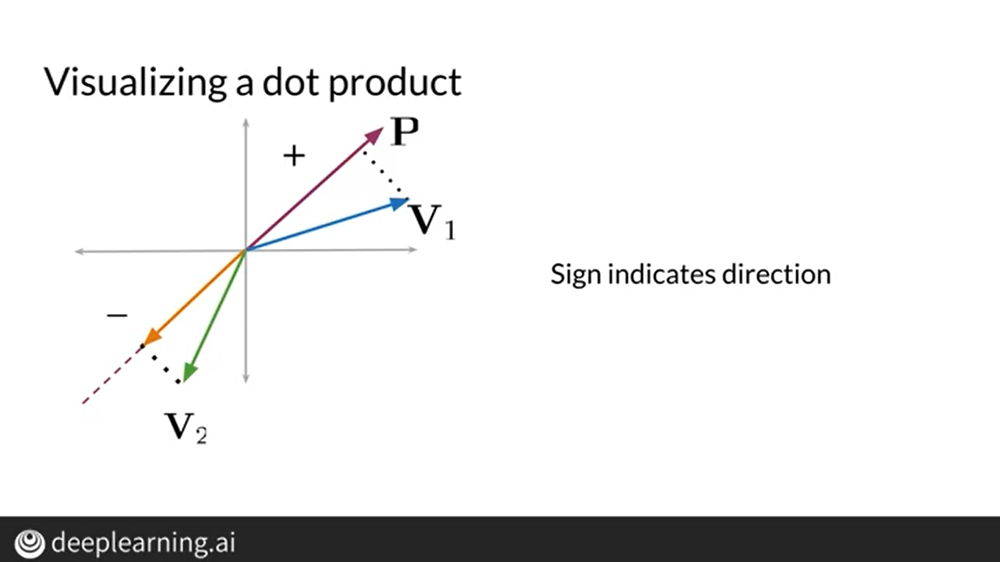

This means that the sign of the dot product indicates the direction of the projection with respect to the purple normal vector. So whether the dot product is positive or negative can tell you whether the vector V1 or V2 are on one side of the plane or the other

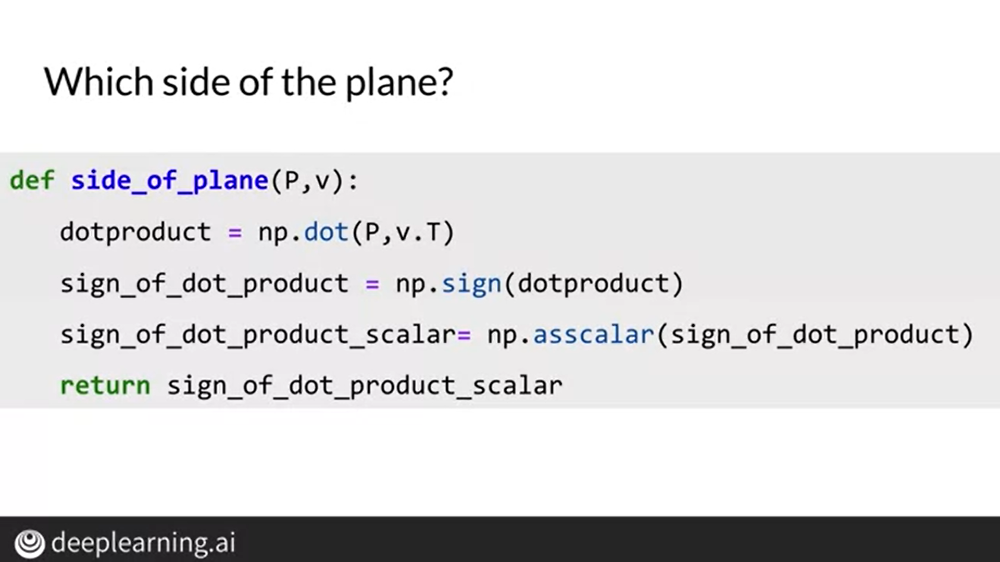

The function side of plane takes in the normal vector P, and the vector v. Use numpy dot to take the dot products. Use numpy.sign to get a plus one if the dot product is positive, minus one if the dot product is negative, or zero if the dot product is zero. I'm using numpy.asscalar. Notice the pronunciation of that function. If a vector can be represented as a single scalar, this function retrieves that scalar, and that's it. 

# Multiple Planes


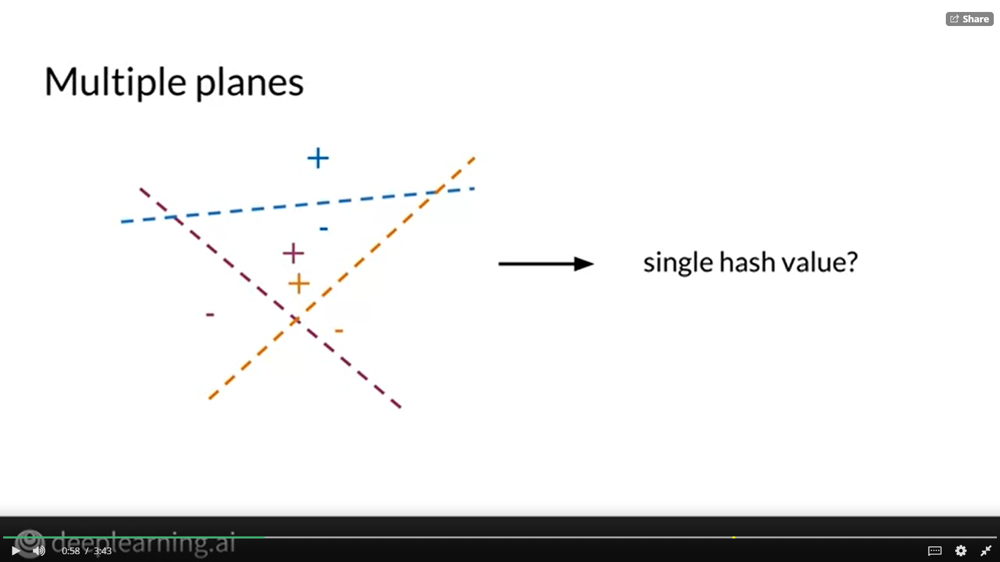

For each plane, you can find out whether a vector is on the positive or negative side of that plane. So you'll get multiple signals, one for each plane and you want to find a way to combine all of those signals into a single hash value. This hash value will define a particular region within the vector space. 

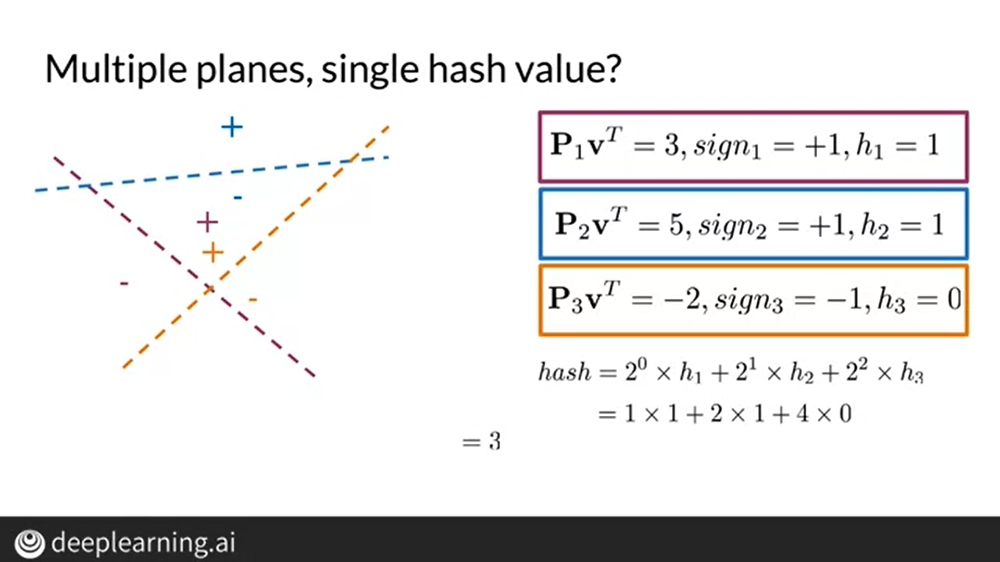

So just as a reminder you have multiple planes and it helps us to divide the vector space into smaller sub regions. But you want to have a single hash value, so you will know which bucket to assign the vectoring. You do this by combining the signals from all the planes into a single hash value.

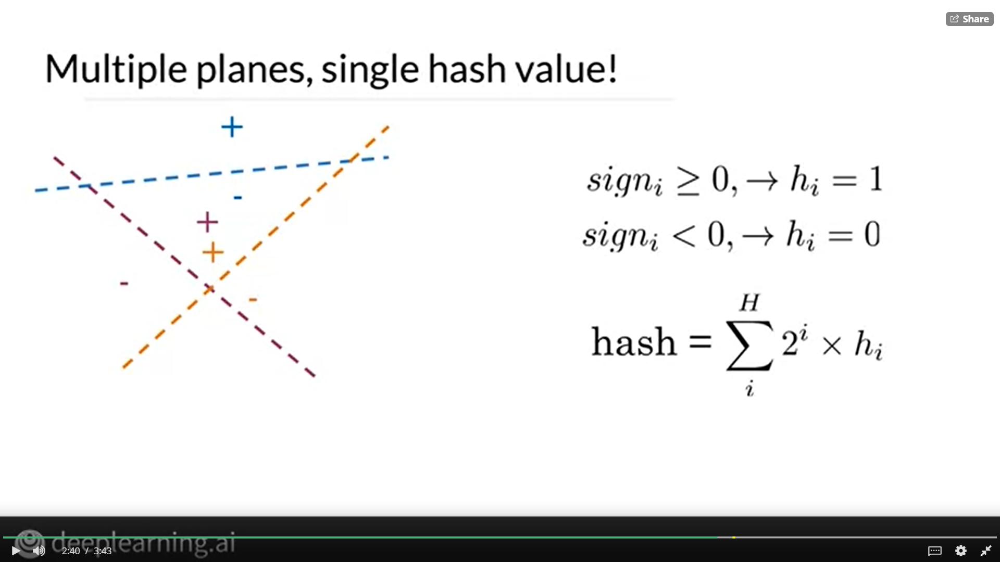

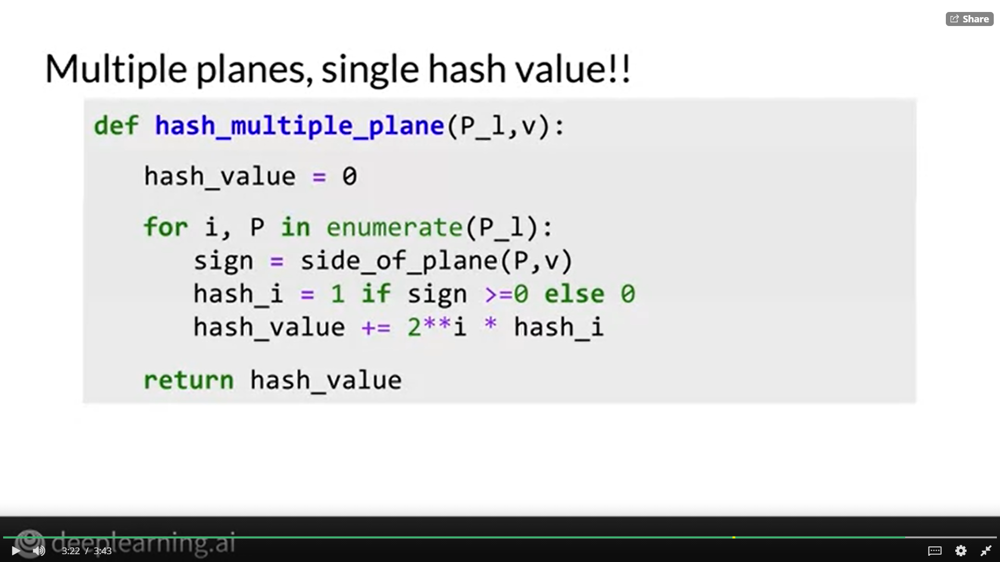

# Approximate nearest neighbors

In the last video, you learned about locality-sensitive hashing. Now it is time to put all this knowledge to use. You will make an algorithm that computes k-nearest neighbors much faster than brute search.

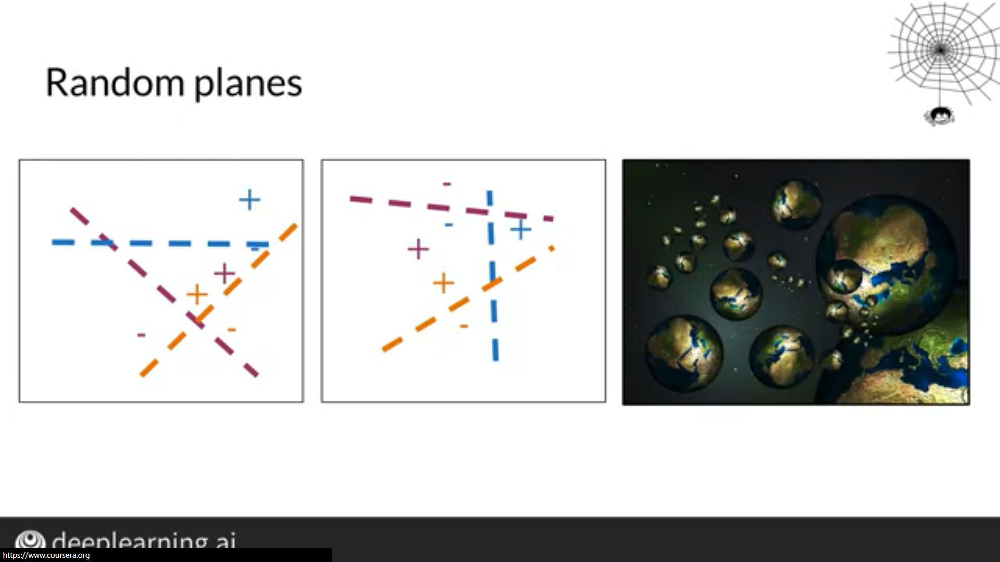

* So far, we've seen that a few planes, such as these three, can divide the vector space into regions. But are these planes the best way to divide up the vector space? 
* What if, instead, you divided the vector space like this? In fact, you can't know for sure which sets of planes is the best way to divide up the vector space, `so why not create multiple sets of random planes so that you can divide up the vector space into multiple, independent sets of hash tables.`

`You can make use of all these different sets of random planes in order to help us find a good set of friendly neighborhood vectors, I mean, a set of k-nearest neighbors.`

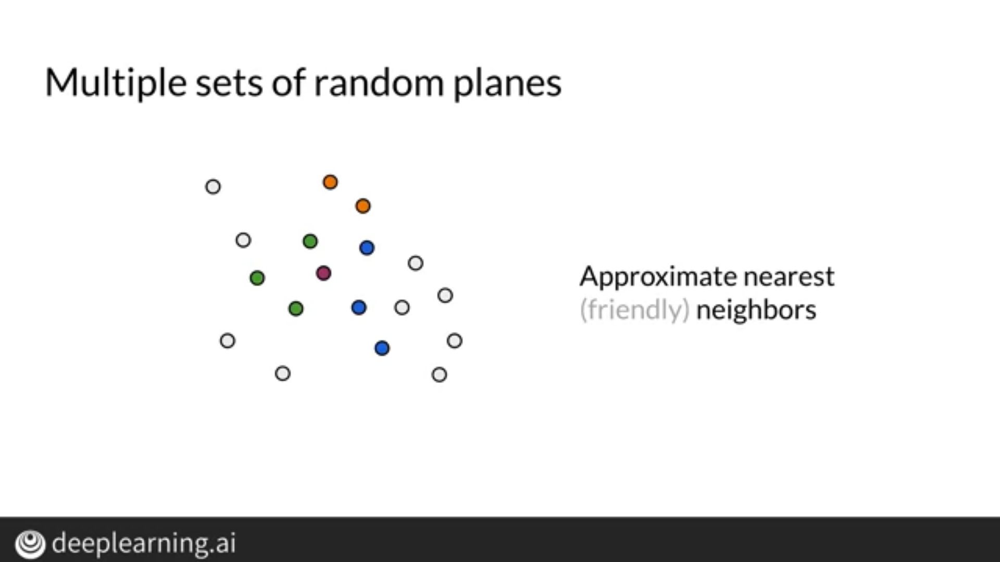

* let's say you have a vector space, and this magenta dot in the middle represents the transformation of an English word into a French word vector. You are trying to find other French word vectors that may be similar
* So maybe one universe of random planes helped us to determine that this magenta vector and these green vectors are all assigned to the same hash bucket.
* Another entirely different set of random planes helped us determine that these blue vectors are in the same hash bucket as the red vector. 
* A third set of random planes helped us determine that these orange vectors are in the same hash bucket as the magenta vector.

 By using multiple sets of random planes for locality-sensitive hashing, you have a more robust way of searching the vector space for a set of vectors that are possible candidates to be nearest neighbors. `This is called approximate nearest neighbors because you're not searching the entire vector space, but just a subset of it.` So it's not the absolute k-nearest neighbors, but it's approximately the k-nearest neighbors

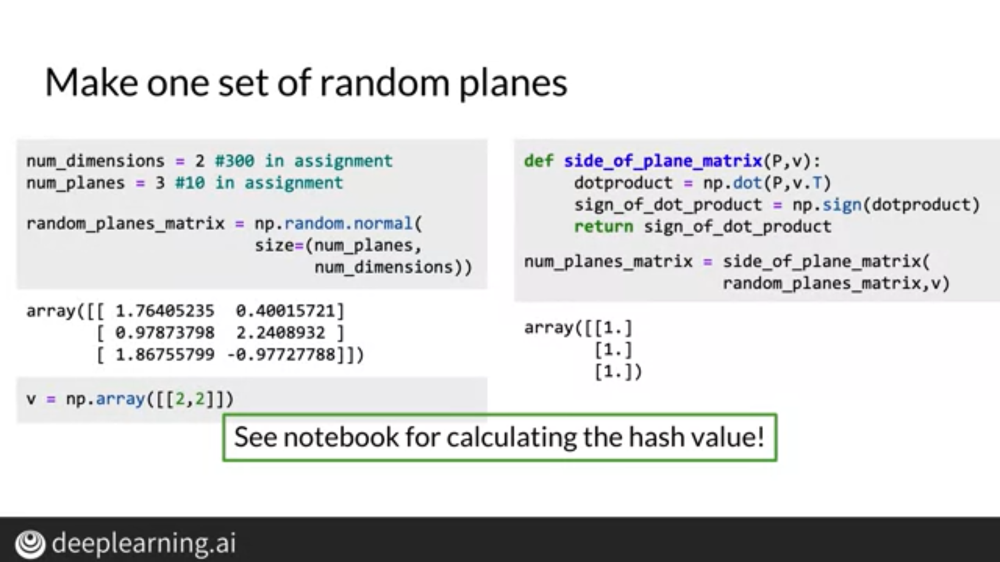

# Searching documents


I will finish this week by showing you how you can use fast k-nearest neighbor to search for pieces of text related to a query in a large collection of documents.

`Represent Entire document as a Word Vector`

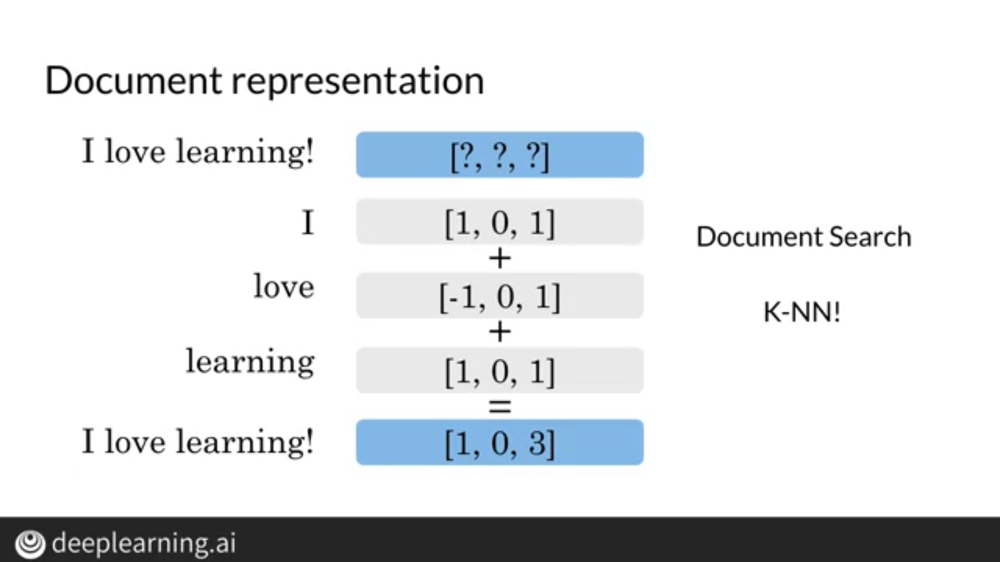

You can then apply document search by using k-nearest neighbors. 

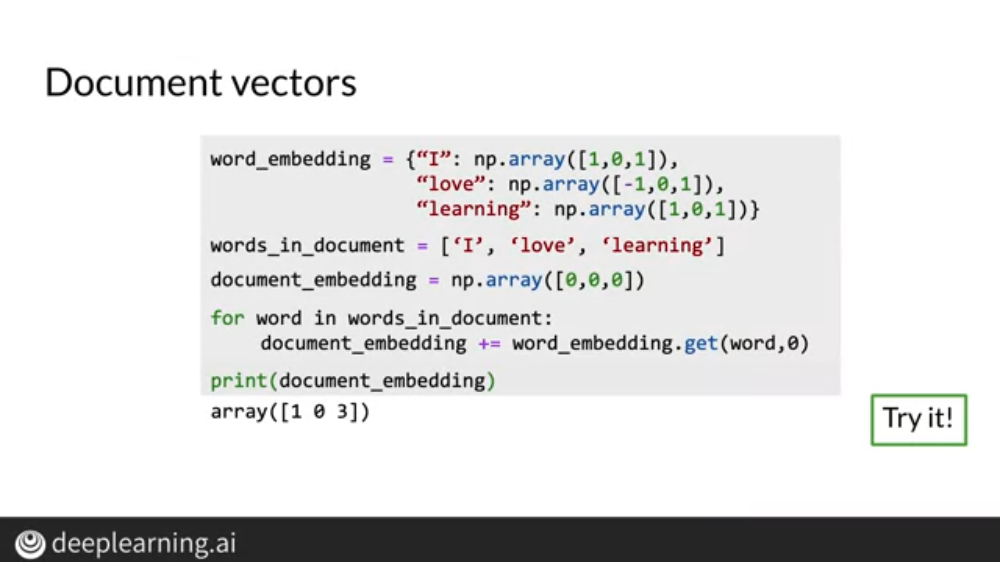

* Now for each word in a document, you'll get the word vector if the word exists in the dictionary else zero.
* You add these all up and return the documents embedding. Please try it out. 
* You learned in this video an example of a very general method that text can be embedded into vector space so that nearest neighbors refer to text with similar meaning. Well, you will learn more advanced ways to embed text. This basic structure will reappear again and again as it's used throughout modern NLP.